In [37]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('darkgrid')
import nltk
from nltk.corpus import stopwords
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from sklearn.feature_extraction.text import CountVectorizer
import string
from nltk import pos_tag
from nltk.stem import WordNetLemmatizer
from nltk.corpus import wordnet
import datetime as dt

nltk.download('averaged_perceptron_tagger')
nltk.download('wordnet')
nltk.download('stopwords')
nltk.download('vader_lexicon')

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Table of Contents
1. [Initial Data Summary](#data_summary)
2. [Data Preprocessing](#preprocessing)
3. [EDA](#eda)

In [3]:
data = '/content/drive/My Drive/Google_Colab/Uncommon_Goods/UG_Review_Data.csv'

df = pd.read_csv(data, parse_dates=[5])
df.drop(['Unnamed: 0'], axis=1, inplace=True)
df.rename(columns={'Reviewer_Country': 'Reviewer_Location'}, inplace=True)
df.head()

,Product,Reviewer_Name,Reviewer_Location,Review,Review_Date,Review_Time,Rating
0,Long Distance Friendship Lamp,Vicky,Florida,"We love our lamps! So much so, I bought a set ...",2020-07-29,12:36:21,5.0
1,Long Distance Friendship Lamp,Lteasenfitz,"Mesa, Az",I got the Long Distance Touch Lamp for my mom ...,2020-07-27,23:39:50,5.0
2,Long Distance Friendship Lamp,Mandy,Texas,These lamps are so cool!,2020-07-19,02:10:45,5.0
3,Long Distance Friendship Lamp,Lauren,"Chicago, IL",We love the lamp because throughout the day we...,2020-07-18,23:37:59,5.0
4,Long Distance Friendship Lamp,Bert,Knoxville Tn,These were easy to assemble and work great. As...,2020-07-17,23:49:57,5.0


## 1. Initial Data Summary
<a id='data_summary'></a>

In [4]:
df.describe()

,Rating
count,434.000000
mean,4.750922
std,0.592378
min,1.000000
25%,4.800000
50%,5.000000
75%,5.000000
max,5.000000


In [5]:
df.Reviewer_Location.value_counts()

New York        8
Florida         6
Colorado        6
New Jersey      5
Boston, MA      5
               ..
Everywhere.     1
KY              1
St Louis, Mo    1
CO              1
Eagle, Idaho    1
Name: Reviewer_Location, Length: 352, dtype: int64

In [6]:
df.Review_Date.value_counts()

2020-07-29    21
2020-07-16    12
2020-07-30    12
2020-07-21    11
2020-07-08    11
              ..
2020-05-10     1
2018-11-02     1
2020-02-24     1
2020-02-10     1
2020-01-11     1
Name: Review_Date, Length: 128, dtype: int64

In [7]:
print('Total Products: {}'.format(df['Product'].nunique()))

Total Products: 45


In [8]:
df.Product.value_counts()

New York Times Custom Birthday Book               10
Intersection of Love - Photo Print                10
Repurposed Cotton Sari Robe                       10
Recycled Metal Ostrich Planter                    10
Children's Rainbow Face Coverings - Set of 2      10
Personalized Family Mugs                          10
World Map Coloring Tablecloth                     10
Mindful Breathing Necklace                        10
Long Distance Friendship Lamp - Wood              10
Gardener's Harvest Basket                         10
Geode Puzzle                                      10
Swimming Koi Sculptures                           10
Personalized Picnic Table Wine Carrier            10
Storm Cloud                                       10
Create Your Own Reel Viewer                       10
Custom Map Tide Clock                             10
Home Team Baseball Game                           10
Founding Fathers Whiskey Glasses                  10
Metal Bird Sculptures                         

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 434 entries, 0 to 433
Data columns (total 7 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   Product            434 non-null    object        
 1   Reviewer_Name      433 non-null    object        
 2   Reviewer_Location  434 non-null    object        
 3   Review             434 non-null    object        
 4   Review_Date        434 non-null    datetime64[ns]
 5   Review_Time        434 non-null    object        
 6   Rating             434 non-null    float64       
dtypes: datetime64[ns](1), float64(1), object(5)
memory usage: 23.9+ KB


## 2. Data Preprocessing
<a id='preprocessing'></a>

In [10]:
df = df.sort_values('Product').set_index(['Product', df.index])

In [11]:
df.head(20)

Reviewer_Name  ... Rating
Product                                                            ...       
3-D Knit Face Mask                   0                      Katie  ...    5.0
                                     1                         JD  ...    5.0
                                     2          Steph in Plymouth  ...    4.0
                                     3                babashopper  ...    5.0
                                     4                     Marcie  ...    5.0
Baseball Park Map Glasses - Set of 2 5                       Edog  ...    5.0
                                     6                      TAU22  ...    5.0
                                     7            Dad's firstborn  ...    5.0
                                     8                       Jule  ...    5.0
                                     9                      Jimmy  ...    4.7
                                     10                   Eshalla  ...    4.9
                                     11                     Dan L  ...    4.5
                                     12                     CaraO  ...    4.8
                                     13                       Jen  ...    4.3
                                     14                        BB  ...    5.0
Birthstone Wishing Balls             15  Not a grumpy grandmother  ...    4.5
                                     16                      Beth  ...    4.9
                                     17                       Deb  ...    4.3
                                     18                     Diana  ...    4.7
                                     19                Uncle Mike  ...    5.0

[20 rows x 6 columns]

In [12]:
df['good_review'] = df['Rating'].apply(lambda x: 0 if x <= 3.0 else 1)
df.head(20)

Reviewer_Name  ... good_review
Product                                                            ...            
3-D Knit Face Mask                   0                      Katie  ...           1
                                     1                         JD  ...           1
                                     2          Steph in Plymouth  ...           1
                                     3                babashopper  ...           1
                                     4                     Marcie  ...           1
Baseball Park Map Glasses - Set of 2 5                       Edog  ...           1
                                     6                      TAU22  ...           1
                                     7            Dad's firstborn  ...           1
                                     8                       Jule  ...           1
                                     9                      Jimmy  ...           1
                                     10                   Eshalla  ...           1
                                     11                     Dan L  ...           1
                                     12                     CaraO  ...           1
                                     13                       Jen  ...           1
                                     14                        BB  ...           1
Birthstone Wishing Balls             15  Not a grumpy grandmother  ...           1
                                     16                      Beth  ...           1
                                     17                       Deb  ...           1
                                     18                     Diana  ...           1
                                     19                Uncle Mike  ...           1

[20 rows x 7 columns]

In [13]:
df['good_review'].value_counts()

1    419
0     15
Name: good_review, dtype: int64

In [14]:
stop_words = stopwords.words('english')

In [15]:
def get_wordnet_pos(pos_tag):
    if pos_tag.startswith('J'):
        return wordnet.ADJ
    elif pos_tag.startswith('V'):
        return wordnet.VERB
    elif pos_tag.startswith('N'):
        return wordnet.NOUN
    elif pos_tag.startswith('R'):
        return wordnet.ADV
    else:
        return wordnet.NOUN

def clean_text(text):

  """
  1. Remove punctuation
  2. Remove stop words
  3. Lemetize text
  4. Return list of clean text words
  """	
    
  # Lower text
  text = text.lower()
  # Tokenize text and remove puncutation
  text = [word.strip(string.punctuation) for word in text.split(" ")]
  # Remove words that contain numbers
  text = [word for word in text if not any(c.isdigit() for c in word)]
  # Remove stop words
  stop = stopwords.words('english')
  text = [x for x in text if x not in stop]
  # Remove empty tokens
  text = [t for t in text if len(t) > 0]
  # Part-of-Speech tag text
  pos_tags = pos_tag(text)
  # Lemmatize text
  text = [WordNetLemmatizer().lemmatize(t[0], get_wordnet_pos(t[1])) for t in pos_tags]
  # Remove words with only one letter
  text = [t for t in text if len(t) > 1]
  # Join all words
  text = " ".join(text)
  return(text)

In [16]:
df['cleaned_reviews'] = df['Review'].apply(clean_text)

In [17]:
df.head()

Reviewer_Name  ...                                    cleaned_reviews
Product                                  ...                                                   
3-D Knit Face Mask 0              Katie  ...  mask wire nose good fit guy really like design...
                   1                 JD  ...  good size washable plus like carbon filter fea...
                   2  Steph in Plymouth  ...  love mask fit nice snug side face narrow heck ...
                   3        babashopper  ...  best everyday/everywhere masks---simple seamle...
                   4             Marcie  ...  ordered gray mask everything design material s...

[5 rows x 8 columns]

In [18]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer

sid = SentimentIntensityAnalyzer()

/usr/local/lib/python3.6/dist-packages/nltk/twitter/__init__.py:20: UserWarning: The twython library has not been installed. Some functionality from the twitter package will not be available.
  warnings.warn("The twython library has not been installed. "


In [19]:
df['review_sentiment'] = df['cleaned_reviews'].apply(sid.polarity_scores)

In [20]:
df = pd.concat([df.drop(['review_sentiment'], axis=1), df['review_sentiment'].apply(pd.Series)], axis=1)

In [21]:
df['day_of_week'] = df['Review_Date'].apply(lambda x: x.weekday())

In [22]:
df['Review_Time'] = pd.to_datetime(df['Review_Time'], format='%H:%M:%S')
df['Review_Time'] = df['Review_Time'].dt.time

## 3. EDA
<a id='eda'></a>

In [23]:
df.head()

Reviewer_Name  ... day_of_week
Product                                  ...            
3-D Knit Face Mask 0              Katie  ...           4
                   1                 JD  ...           4
                   2  Steph in Plymouth  ...           4
                   3        babashopper  ...           5
                   4             Marcie  ...           6

[5 rows x 13 columns]

In [24]:
#sns.lineplot(x='Review_Date', y='')
review_count_by_date = df.groupby('Review_Date')['Reviewer_Name'].count().\
reset_index().rename(columns={'Reviewer_Name': 'Count'})

review_count_by_date.head()

,Review_Date,Count
0,2018-03-27,1
1,2018-04-14,1
2,2018-11-02,1
3,2019-04-09,1
4,2019-04-23,1


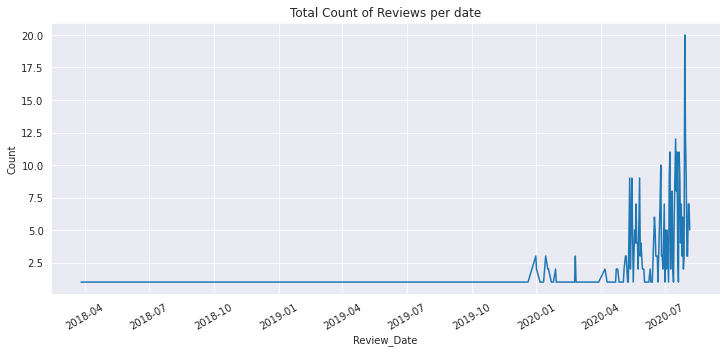

In [38]:
plt.figure(figsize=(12, 5))
sns.lineplot(x='Review_Date', y='Count', data=review_count_by_date)
plt.xticks(rotation=30)
plt.title('Total Count of Reviews per date')
plt.show()

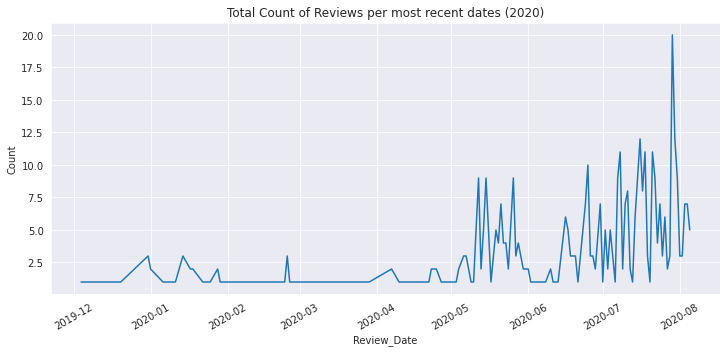

In [39]:
plt.figure(figsize=(12, 5))
sns.lineplot(x='Review_Date', y='Count', data=review_count_by_date[10:])
plt.xticks(rotation=30)
plt.title('Total Count of Reviews per most recent dates (2020)')
plt.show()

From the two plots above I can deduct that a majority of the first 10 reviews for a product are more recent. Although there are reviews all the way back from 2018 in our sample data set, a majority of the reviews are between May and August 2020.

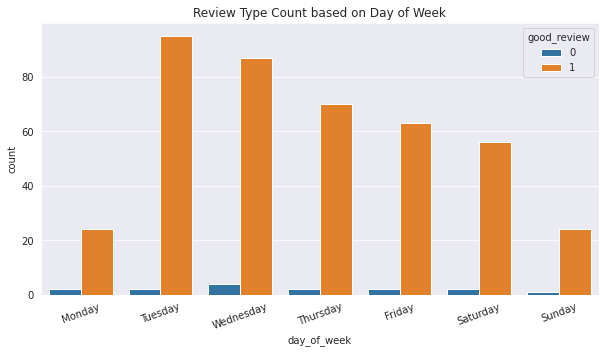

In [40]:
plt.figure(figsize=(10, 5))
dow = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
sns.countplot(x='day_of_week', hue='good_review', data=df)
plt.title('Review Type Count based on Day of Week')
plt.xticks(ticks= range(len(dow)), labels=dow, rotation=20)
plt.show()

We can see above that Tuesday yields the highest amount of good reviews, and Wednesday yields the highest amount of bad reviews.

In [28]:
df['review_hour'] = pd.to_datetime(df['Review_Time'], format='%H:%M:%S').dt.hour

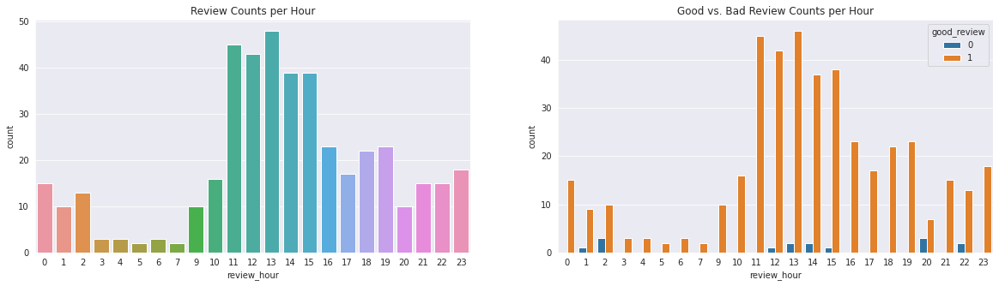

In [41]:
plt.figure(figsize=(20, 5))
plt.subplot(121)
sns.countplot(x='review_hour', data=df)
plt.title('Review Counts per Hour')

plt.subplot(122)
sns.countplot(x='review_hour', hue='good_review', data=df)
plt.title('Good vs. Bad Review Counts per Hour')
plt.show()

From the count plots above I can tell that 1pm is the hour where the most reviews are published. 11am, and 12pm are closely behind.
I also see that 1pm is the hour where the most good reviews are published. Again 11am, and 12pm are closely behind.
8pm, and 2am are the two hours when bad reviews seem to be published the most. This might show that there might be other factors leading to someone's bad review - for example they might have just had a rough day at work, and might be taking their frustration out by writing a bad review.

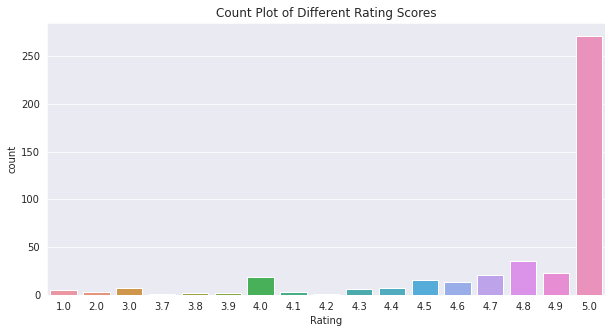

In [42]:
plt.figure(figsize=(10, 5))
sns.countplot(x='Rating', data=df)
plt.title('Count Plot of Different Rating Scores')
plt.show()

The plot above shows that without question a 5 star ratings are the most frequent review ratings in this dataset. Over 250 reviews are 5 stars. All other rating scores do not even have more than 50 reviews.

In [43]:
def CDF_plot(data, x_label, title=None):
    sorted_data = np.sort(data)
    cdf_data = np.arange(1, len(sorted_data) +1)/ len(sorted_data + 1)
    plt.plot(sorted_data, cdf_data)
    plt.xlabel(x_label)
    plt.ylabel('CDF')
    plt.title(title)
    plt.show()

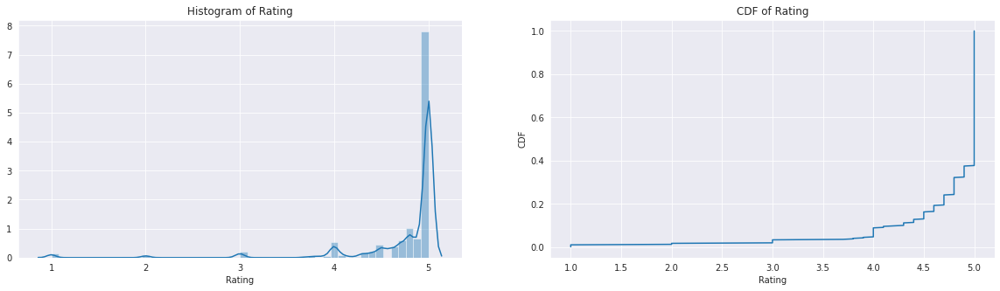

In [44]:
plt.figure(figsize=(20, 5))

plt.subplot(121)
sns.distplot(df['Rating'])
plt.title('Histogram of Rating')

plt.subplot(122)
CDF_plot(df['Rating'], x_label='Rating', title='CDF of Rating')
plt.show()

The plots above show the distribution of Rating. About 60% of all of the reviews in this dataset are 5 stars.
Less than 10% of the reviews in this dataset are under 3 stars. The dataset is definitely uneven in terms of Ratings.

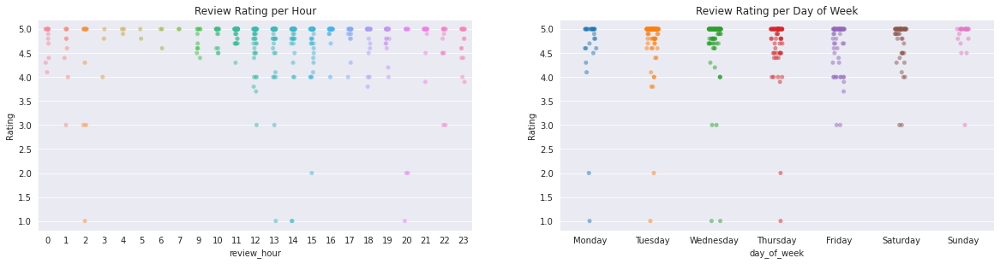

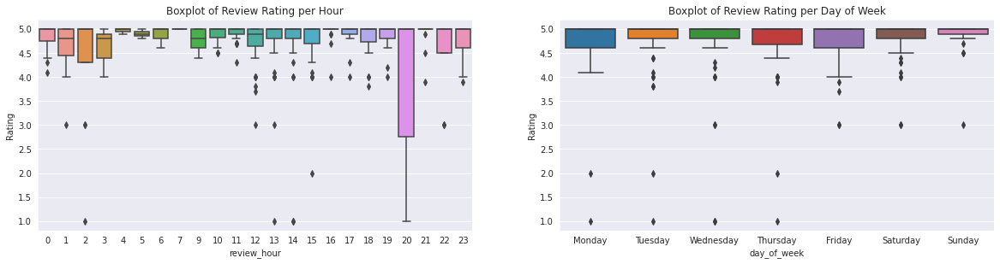

In [45]:
plt.figure(figsize=(20, 10))
plt.subplot(221)
sns.stripplot(x='review_hour', y='Rating', data=df, alpha=0.5)
plt.title('Review Rating per Hour')

plt.subplot(222)
sns.stripplot(x='day_of_week', y='Rating', data=df, alpha=0.5)
plt.title('Review Rating per Day of Week')
plt.xticks(range(len(dow)), labels=dow)
plt.show()

plt.figure(figsize=(20, 10))
plt.subplot(223)
sns.boxplot(x='review_hour', y='Rating', data=df)
plt.title('Boxplot of Review Rating per Hour')

plt.subplot(224)
sns.boxplot(x='day_of_week', y='Rating', data=df)
plt.title('Boxplot of Review Rating per Day of Week')
plt.xticks(range(len(dow)), labels=dow)
plt.show()

The plots above give a better idea of how Rating score differ per hour, and per day of the week.

We can see above that 8pm has the widest range of review ratings of all hours, and Monday has the widest range of review ratings of all days. 

Sundays seem to consist of almost only ratings between 4.8 and 5.0, and from 3am - 9am we only see ratings of roughly 4.5 and up.


Tuesday has a lot of ratings above 4.5, but there are a few outliers on Tuesay as well.

Mornings look to have no bad reviews - maybe this is becuase people are starting their days happy, and full of energy, and refreshed. Afternoons after about 1pm and late night up until about 2am is the time period with a larger portion of lower ratings. This could be due to the effect of work, and drain from the day as mentioned earlier.

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  


Living Composter:


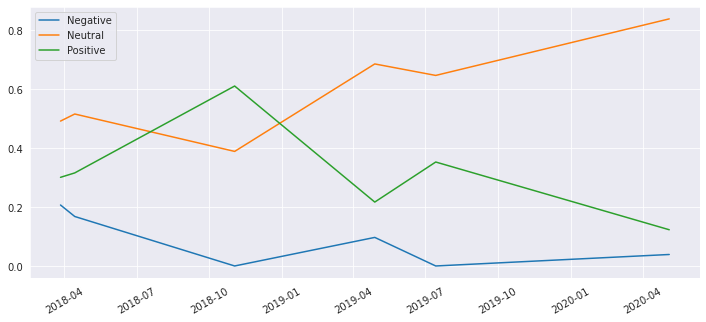



Table Topics:


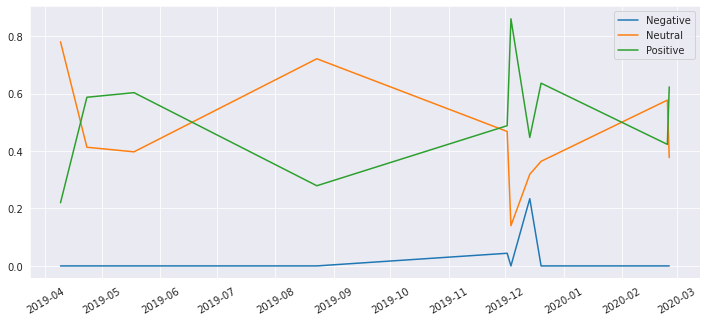



Founding Fathers Whiskey Glasses:


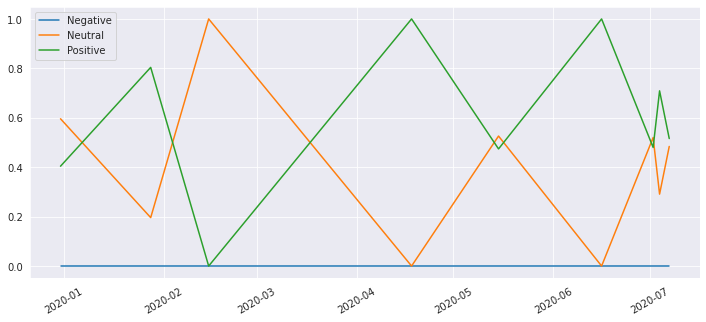



PhoneSoap Smartphone Sanitizer:


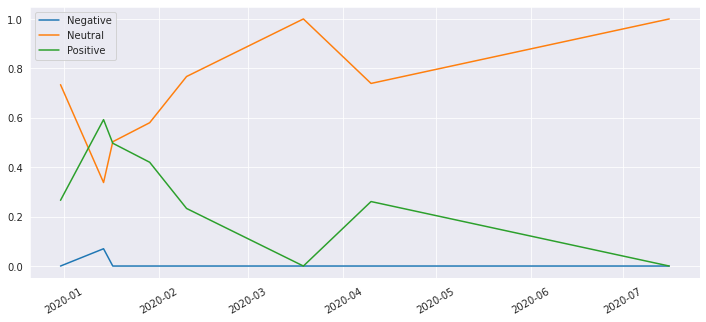



Mindful Breathing Necklace:


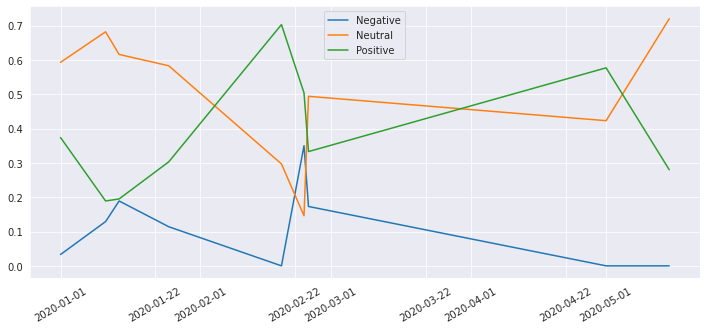



Swimming Koi Sculptures:


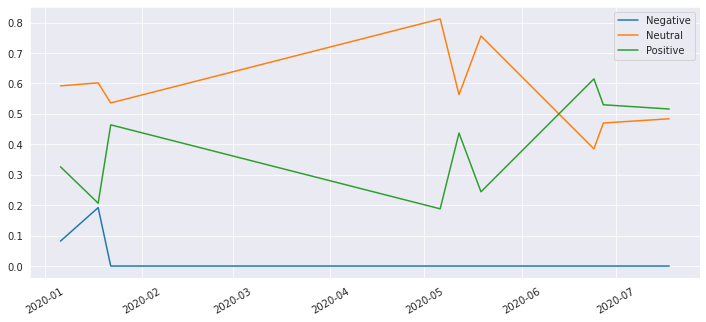



Ocean Sand Art:


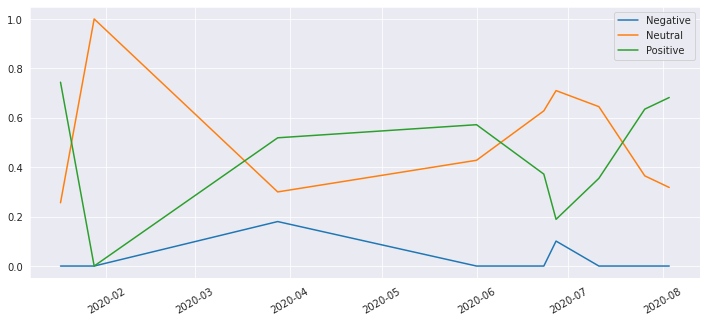



Personalized Family Mugs:


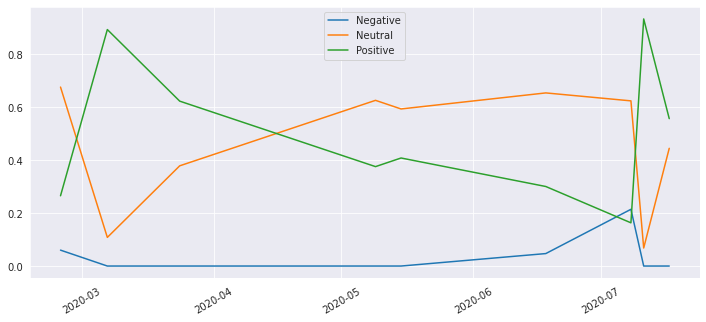



Just Ripe Fruit Bowl:


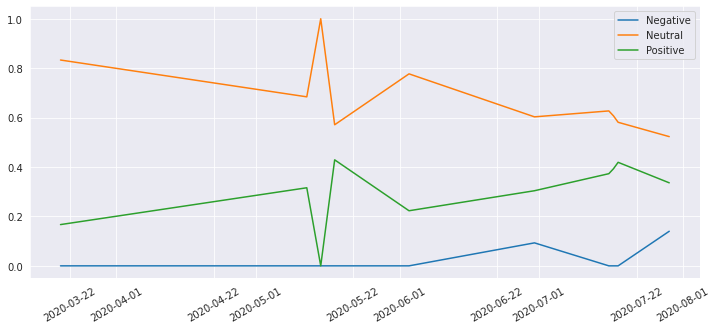



Custom Lake Art Cribbage Board:


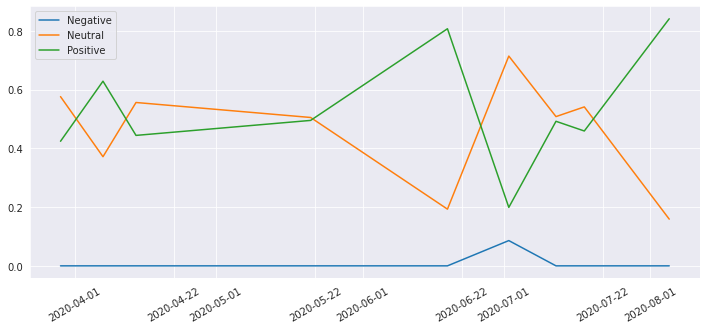



Long Distance Friendship Lamp - Wood:


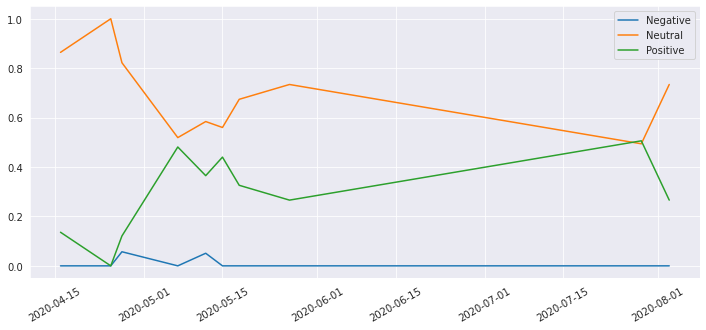



Velociraptor Garden Sculpture Set:


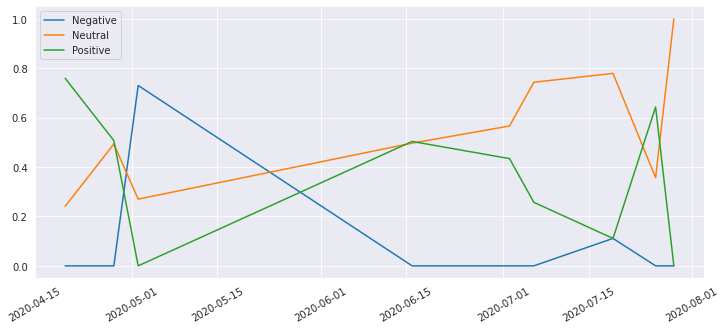



Personalized Picnic Table Wine Carrier:


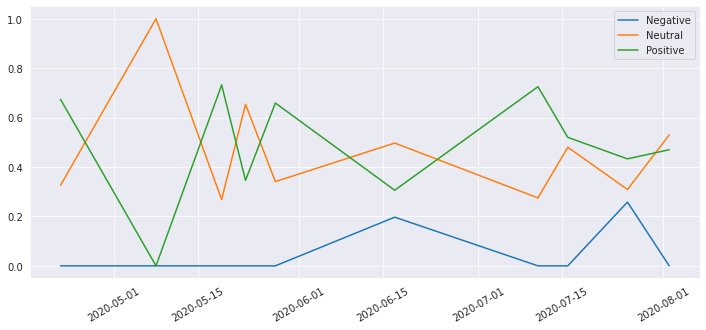



My Life Story - So Far:


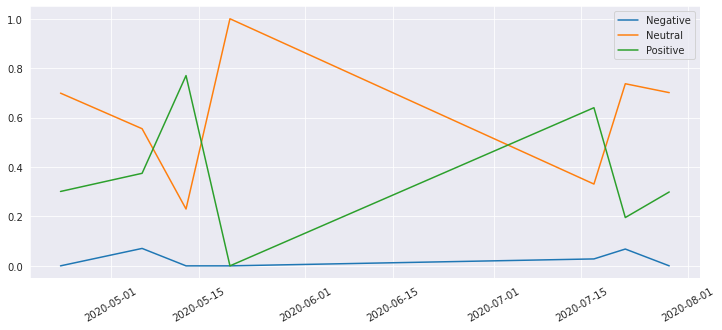



Calming Shower Steamers Gift Set:


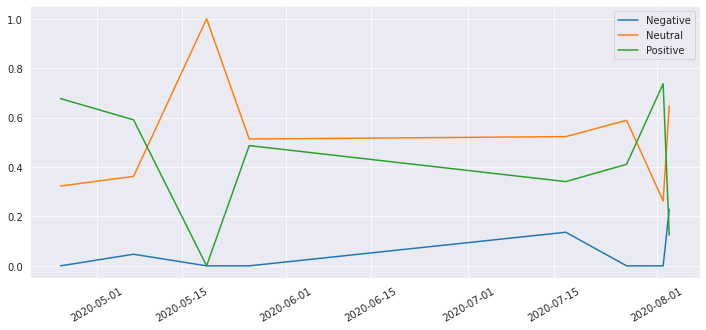



Tabletop Cornhole:


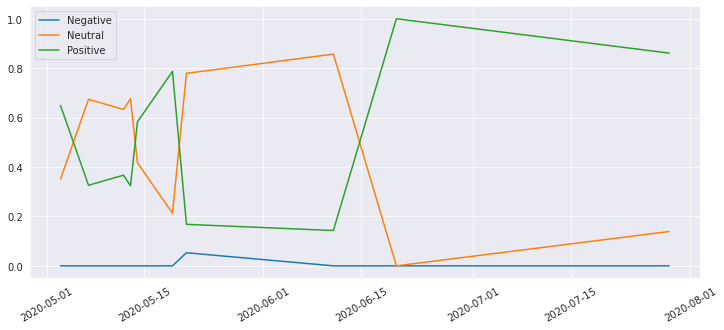



Custom Map Tide Clock:


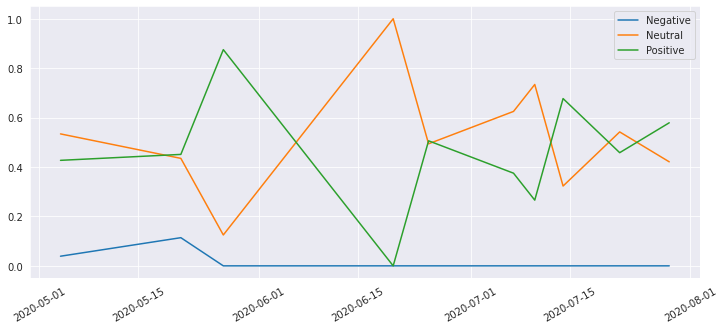



Recycled Metal Ostrich Planter:


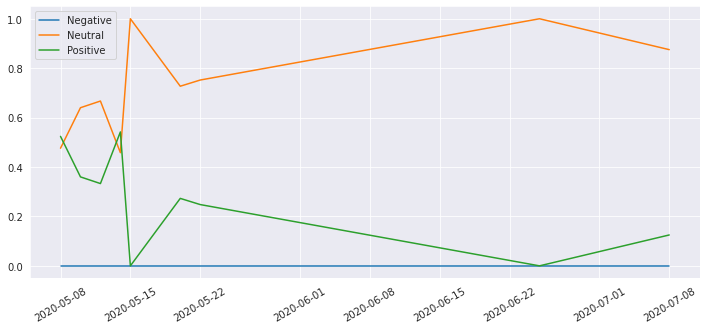



Geode Puzzle:


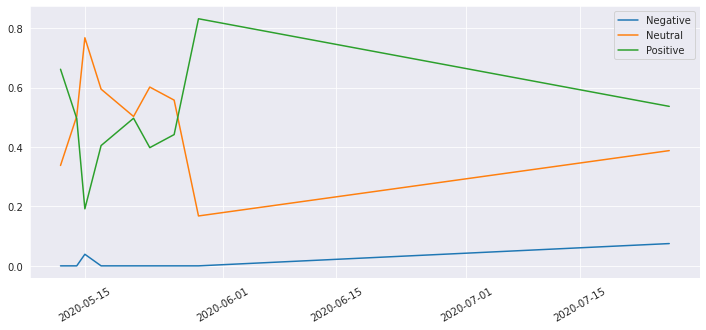



Long Distance Friendship Lamp:


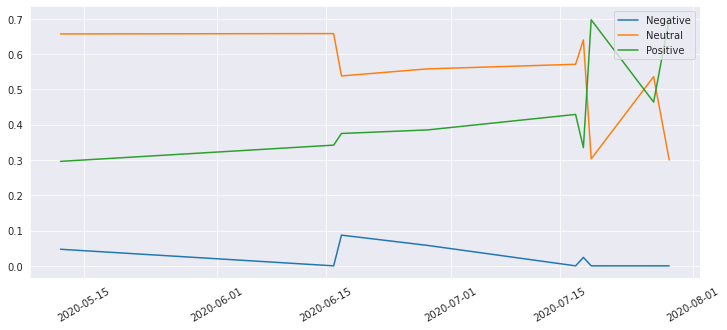



Infinite Galaxy Puzzle:


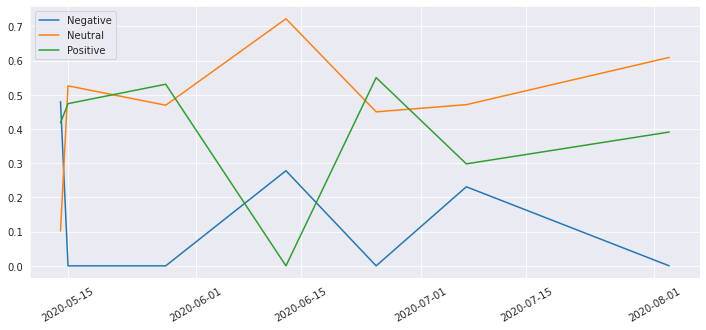



Spotted Wellies Garden Ducks:


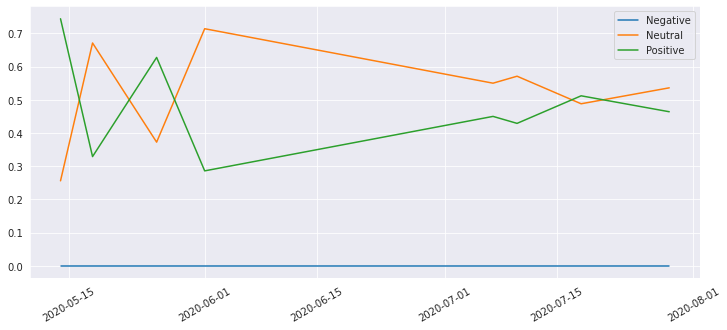



Storm Cloud:


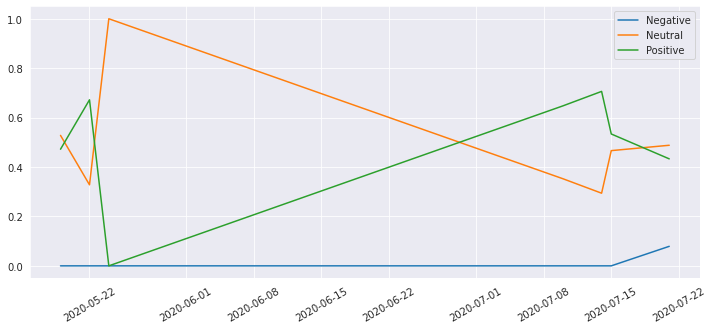



Birthstone Wishing Balls:


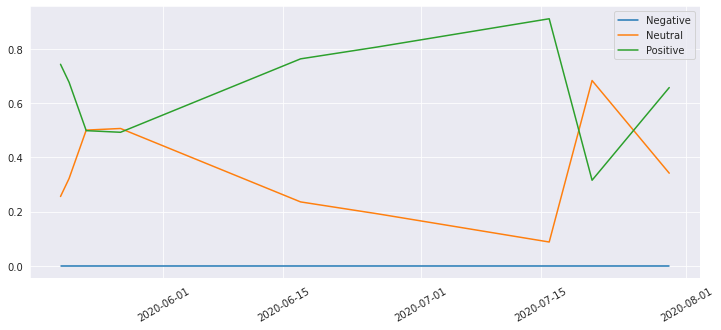



Personalized Hearts Four-Across Game:


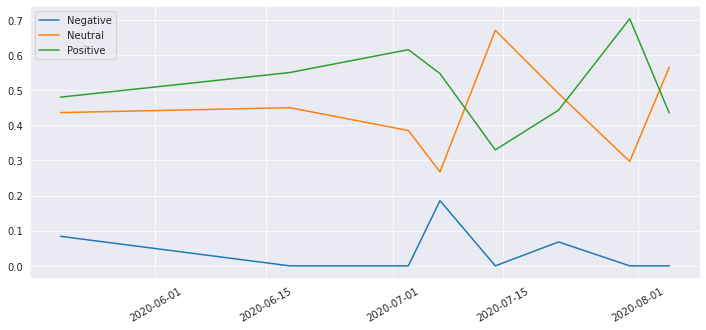



Long Distance Touch Bracelet Set:


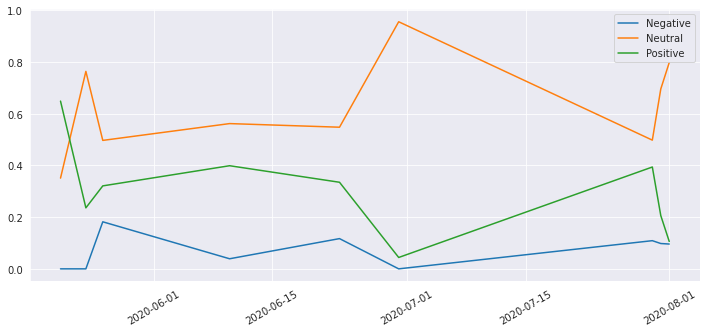



Personalized Family Print:


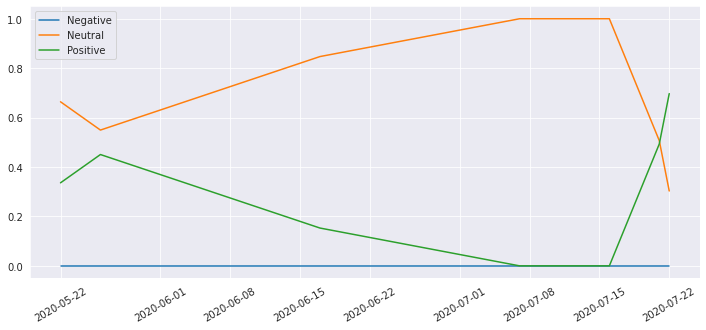



Rainbow Face Coverings - Set of 2:


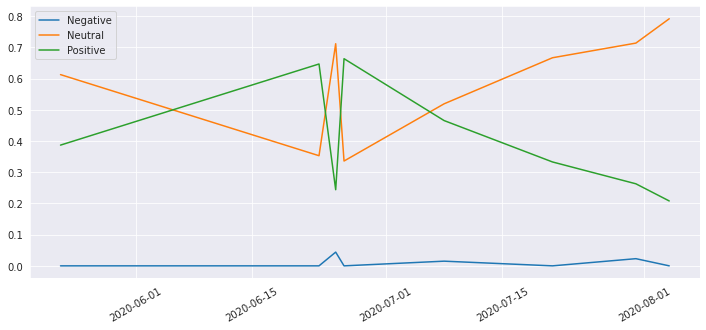



USA Coloring Tablecloth:


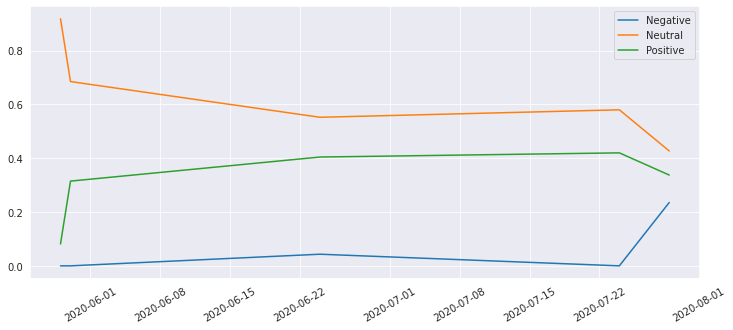



World Map Coloring Tablecloth:


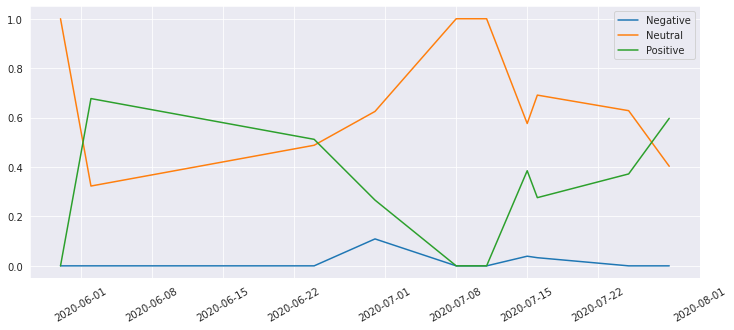



Personalized Family Member Signpost:


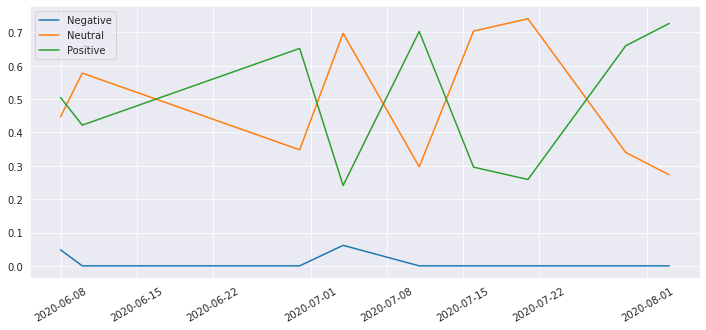



Mandala Wind Spinner:


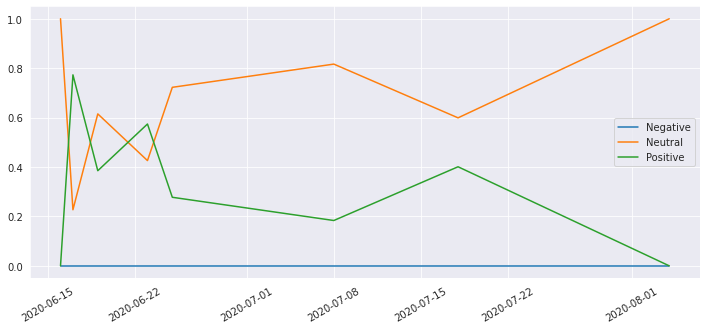



Metal Bird Sculptures:


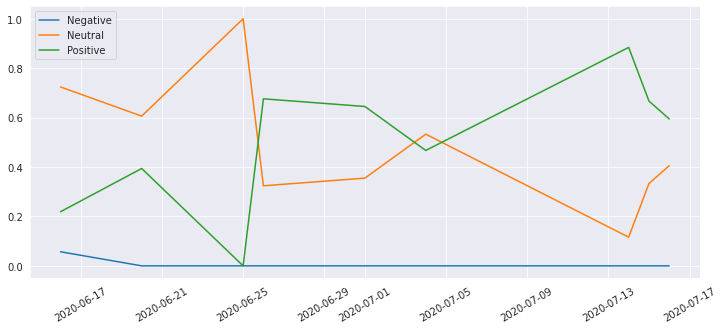



Pistachio Pedestal:


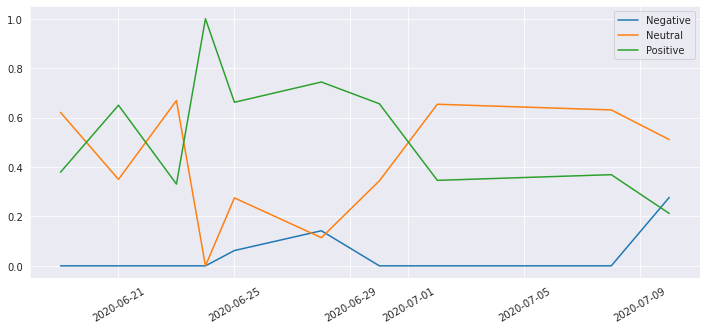



New York Times Custom Birthday Book:


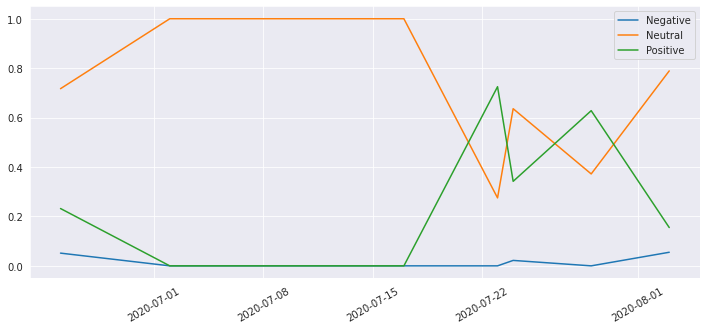



Repurposed Cotton Sari Robe:


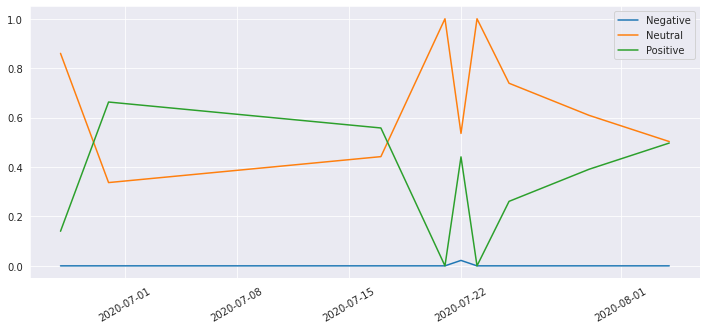



Children's Rainbow Face Coverings - Set of 2:


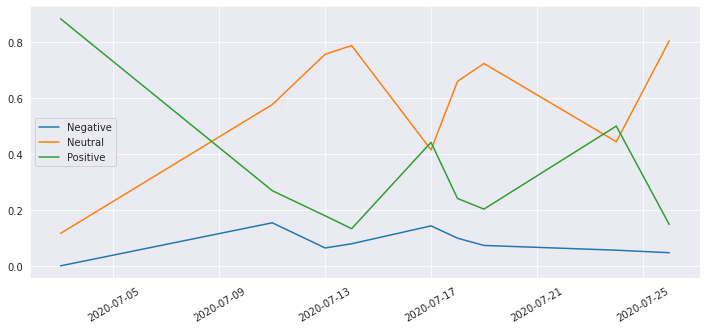



3-D Knit Face Mask:


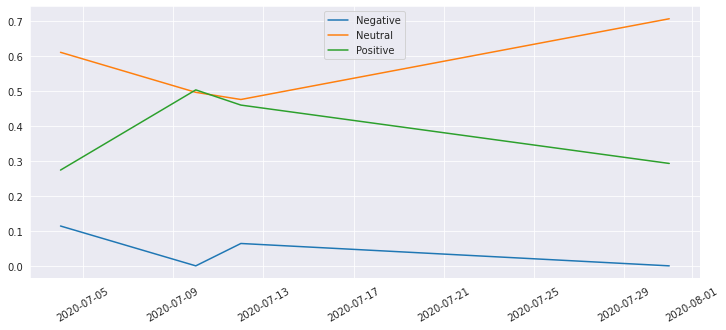



Intersection of Love - Photo Print:


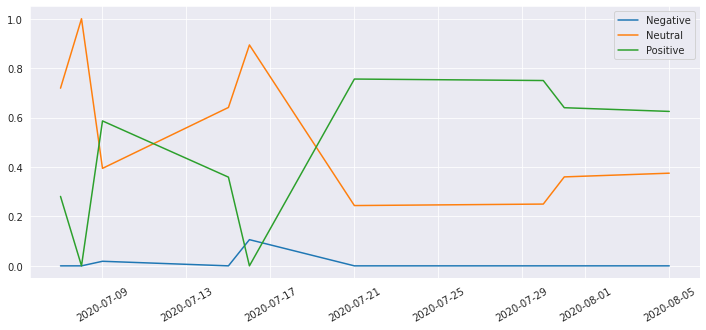



Gardener's Harvest Basket:


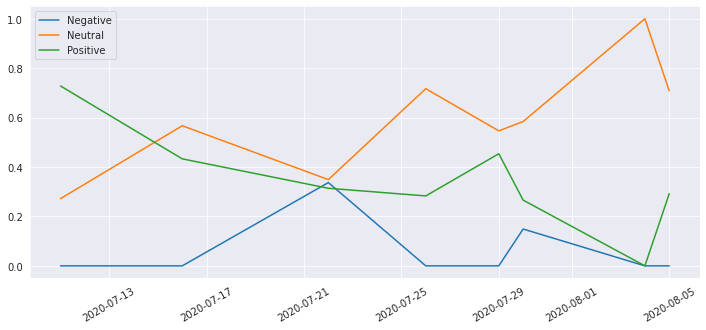



Wine Chilling Coasters with Glasses - Set of 2:


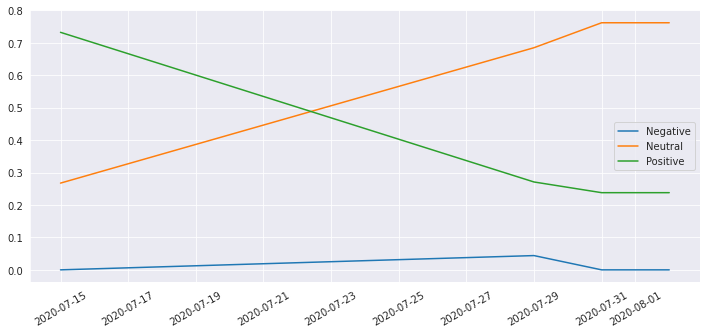



New York Times Custom Front Page Puzzle:


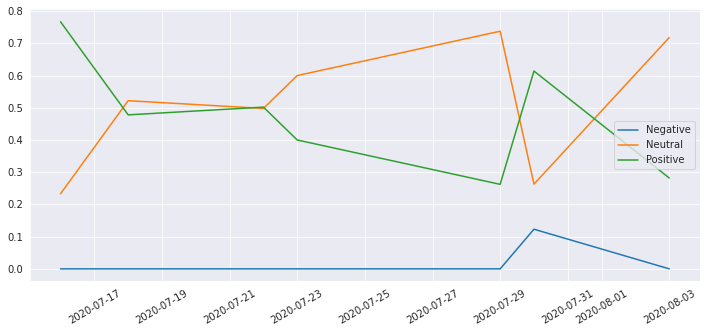



Baseball Park Map Glasses - Set of 2:


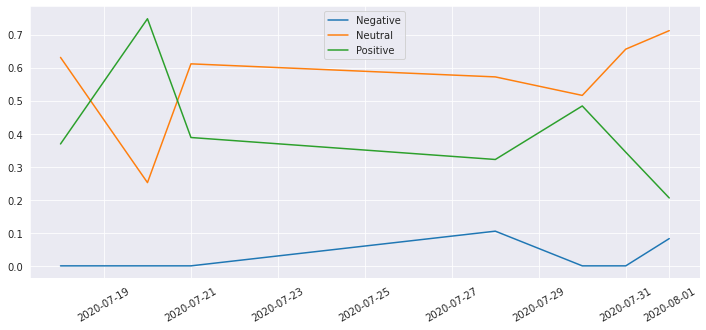



Create Your Own Reel Viewer:


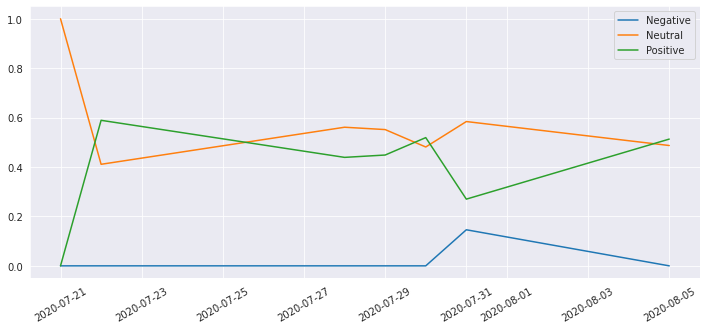



Home Team Baseball Game:


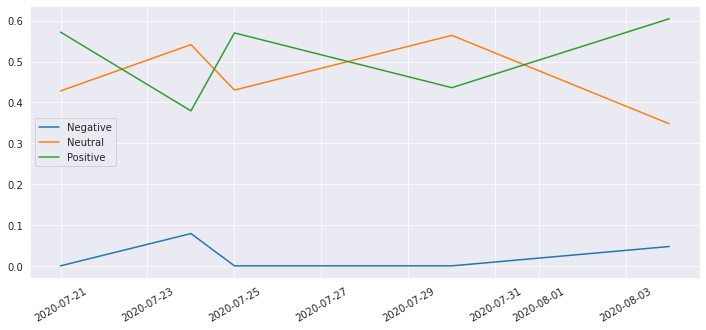

In [46]:
temp_df = df.copy().reset_index()
score_avg_per_day = temp_df.groupby(['Review_Date', 'Product'])['neg', 'neu', 'pos'].mean().reset_index()

score_avg_per_day = score_avg_per_day.set_index(['Product', score_avg_per_day.index])

for product in score_avg_per_day.index.get_level_values(0).unique():
  print(product + ':')
  plt.figure(figsize=(12, 5))
  plt.plot(score_avg_per_day.loc[product]['Review_Date'], score_avg_per_day.loc[product]['neg'], label='Negative')
  plt.plot(score_avg_per_day.loc[product]['Review_Date'], score_avg_per_day.loc[product]['neu'], label='Neutral')
  plt.plot(score_avg_per_day.loc[product]['Review_Date'], score_avg_per_day.loc[product]['pos'], label='Positive')
  plt.legend()
  plt.xticks(rotation=30)
  plt.show()
  print('\n')

I created a plot for each product to map out the average scores for negative, neutral, and positive sentiment reviews over time to see if there were any trends per product.

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """Entry point for launching an IPython kernel.


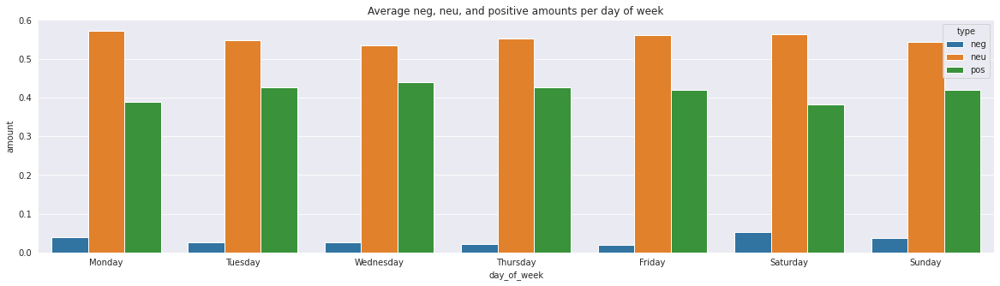

In [47]:
score_avg_per_dow = df.groupby('day_of_week')['neg', 'neu', 'pos'].mean().reset_index()

score_avg_per_dow = pd.melt(score_avg_per_dow, id_vars='day_of_week', value_vars=['neg', 'neu', 'pos'],
        var_name='type', value_name='amount')

dow = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
plt.figure(figsize=(20, 5))
sns.barplot(x='day_of_week', y='amount', hue='type', data=score_avg_per_dow)
plt.title('Average neg, neu, and positive amounts per day of week')
plt.xticks(range(len(dow)), dow)
plt.show()

It looks like Monday yields the highest amount of neutral sentiment in reviews, with Wednesday yielding the highest amount of positive sentiment, and Saturday yielding the highest amount of negative sentiment. I do see a trend that a majority of reviews have neutral sentiment, and positive sentiment. Neutral is highest though, and I think that could be due to shorter reviews that don't elaborate, or use as many positive words, or punctuation. It could also be due to people not being head over heels in love with a product, but liking it enough to give a high rating.



3-D Knit Face Mask Word Cloud:


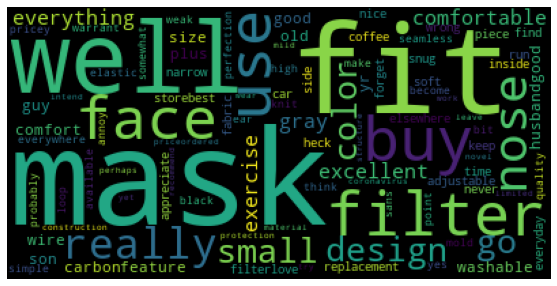



Baseball Park Map Glasses - Set of 2 Word Cloud:


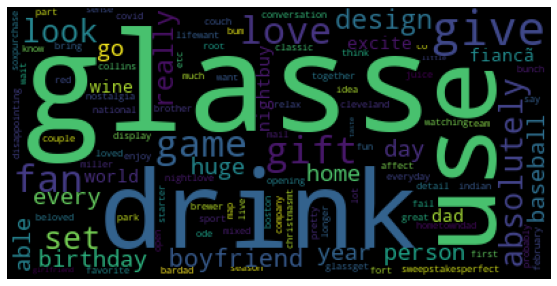



Birthstone Wishing Balls Word Cloud:


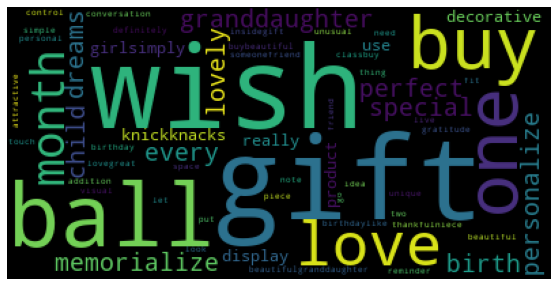



Calming Shower Steamers Gift Set Word Cloud:


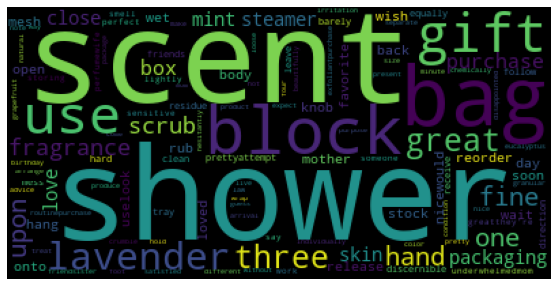



Children's Rainbow Face Coverings - Set of 2 Word Cloud:


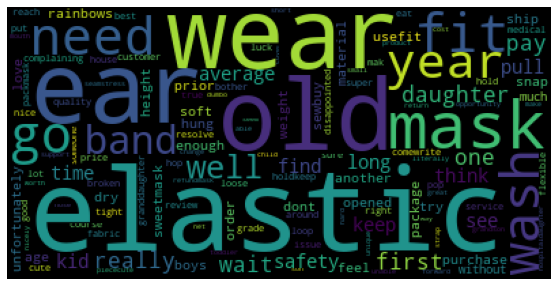



Create Your Own Reel Viewer Word Cloud:


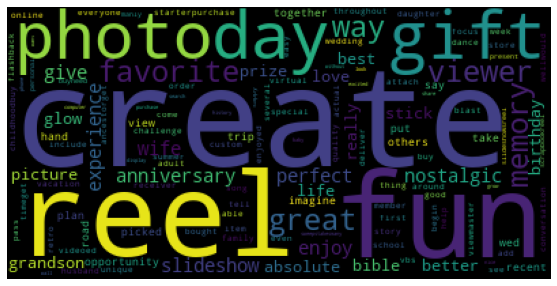



Custom Lake Art Cribbage Board Word Cloud:


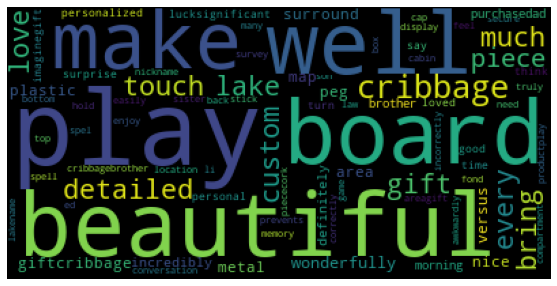



Custom Map Tide Clock Word Cloud:


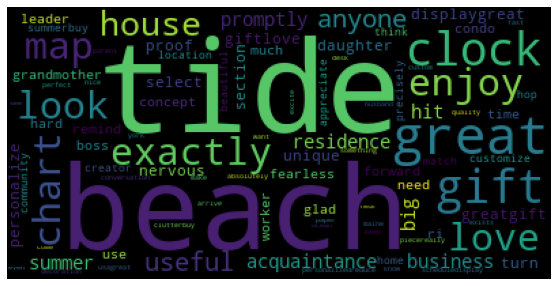



Founding Fathers Whiskey Glasses Word Cloud:


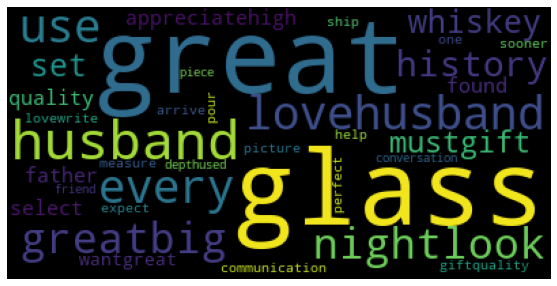



Gardener's Harvest Basket Word Cloud:


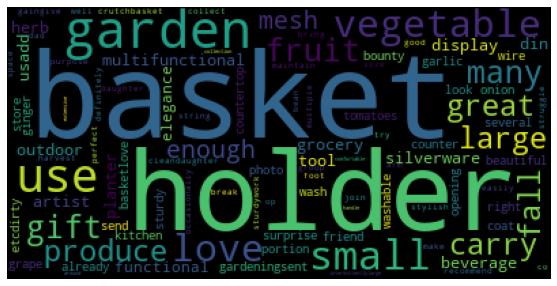



Geode Puzzle Word Cloud:


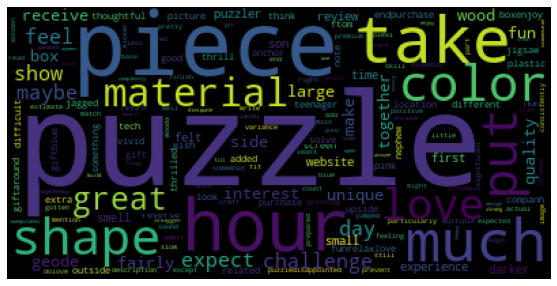



Home Team Baseball Game Word Cloud:


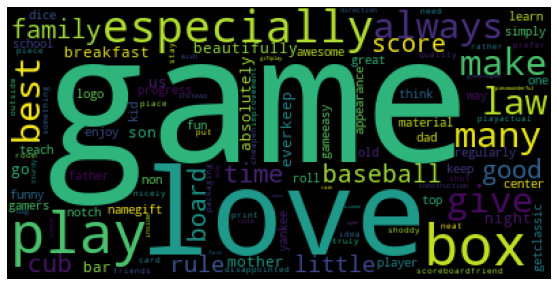



Infinite Galaxy Puzzle Word Cloud:


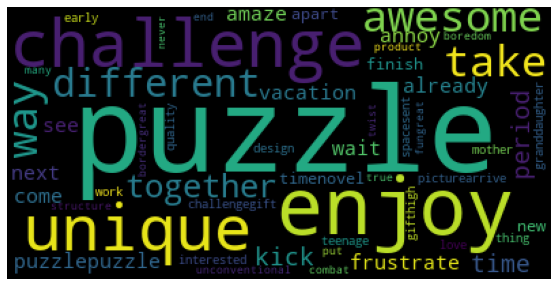



Intersection of Love - Photo Print Word Cloud:


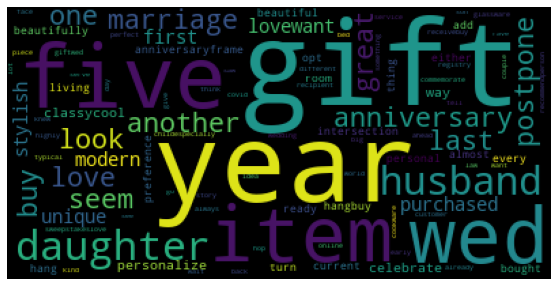



Just Ripe Fruit Bowl Word Cloud:


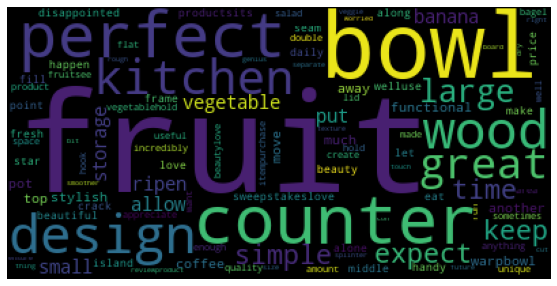



Living Composter Word Cloud:


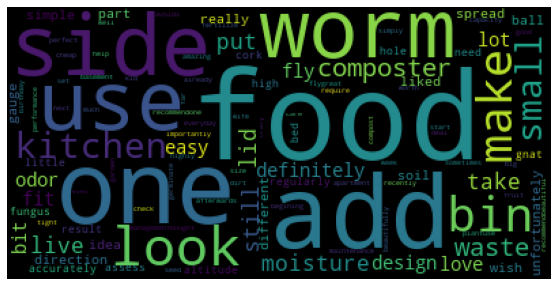



Long Distance Friendship Lamp Word Cloud:


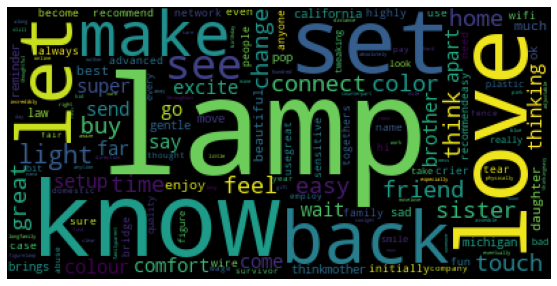



Long Distance Friendship Lamp - Wood Word Cloud:


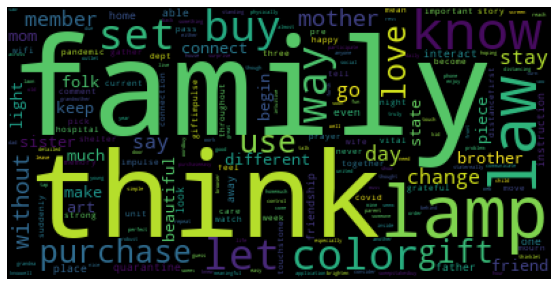



Long Distance Touch Bracelet Set Word Cloud:


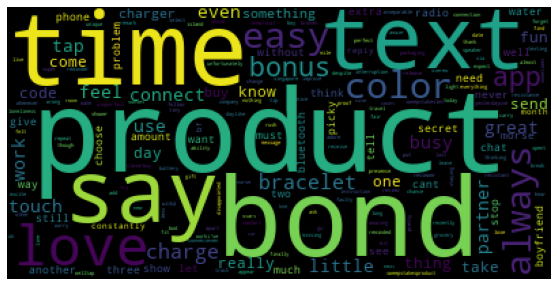



Mandala Wind Spinner Word Cloud:


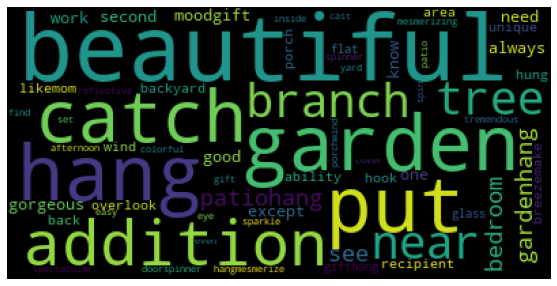



Metal Bird Sculptures Word Cloud:


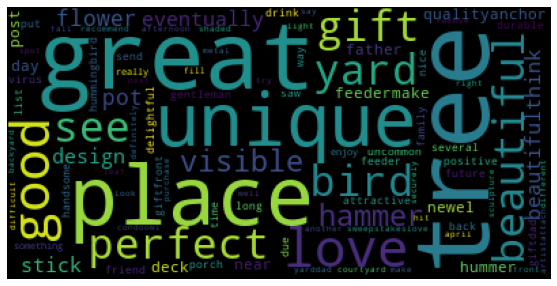



Mindful Breathing Necklace Word Cloud:


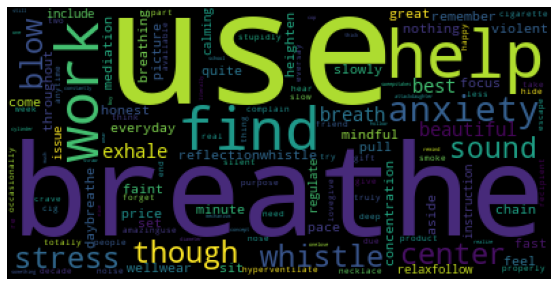



My Life Story - So Far Word Cloud:


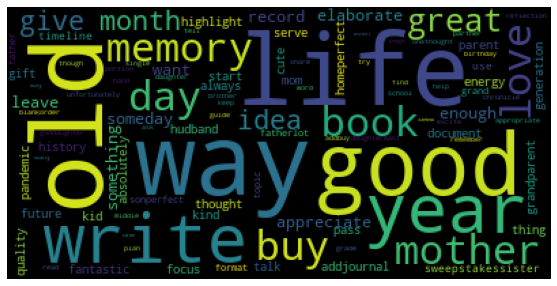



New York Times Custom Birthday Book Word Cloud:


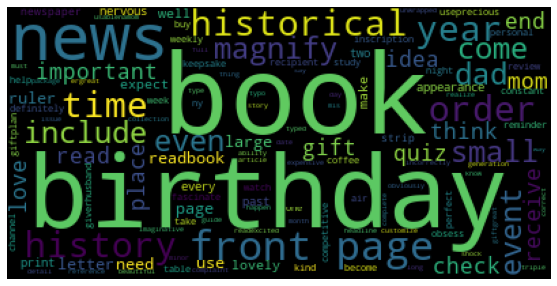



New York Times Custom Front Page Puzzle Word Cloud:


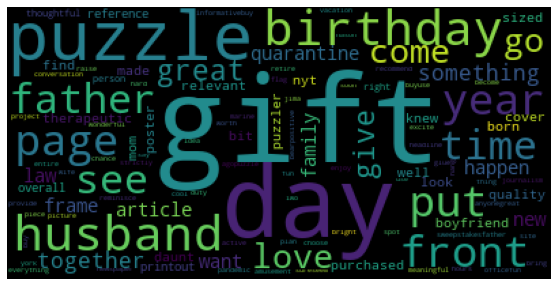



Ocean Sand Art Word Cloud:


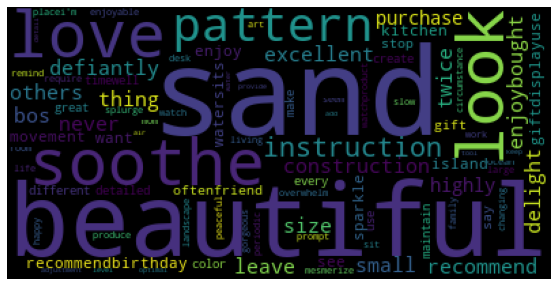



Personalized Family Member Signpost Word Cloud:


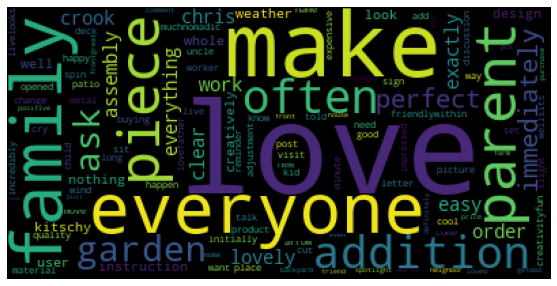



Personalized Family Mugs Word Cloud:


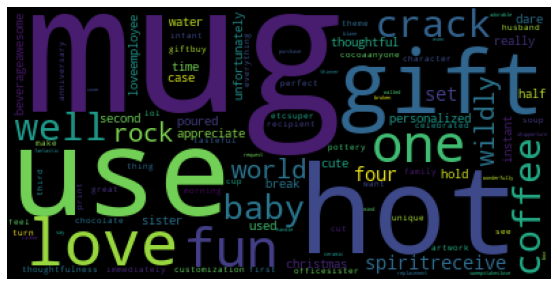



Personalized Family Print Word Cloud:


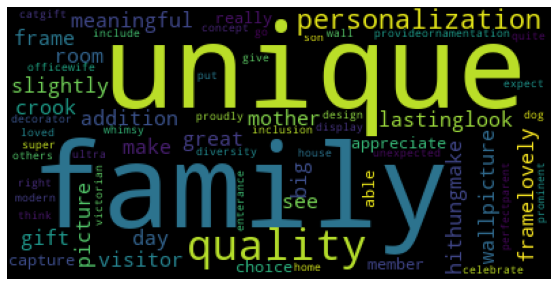



Personalized Hearts Four-Across Game Word Cloud:


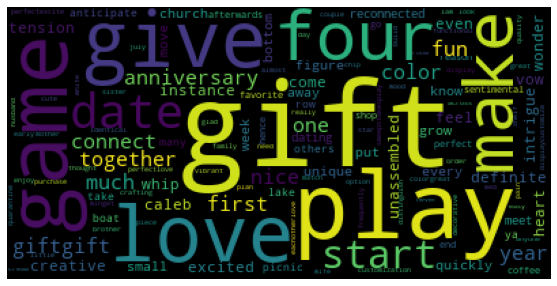



Personalized Picnic Table Wine Carrier Word Cloud:


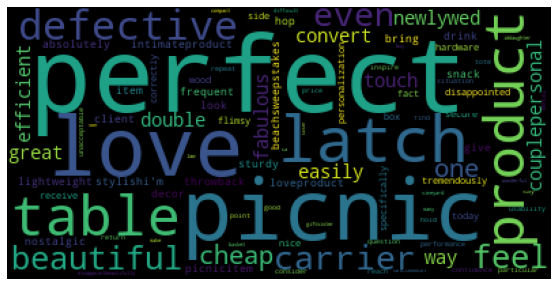



PhoneSoap Smartphone Sanitizer Word Cloud:


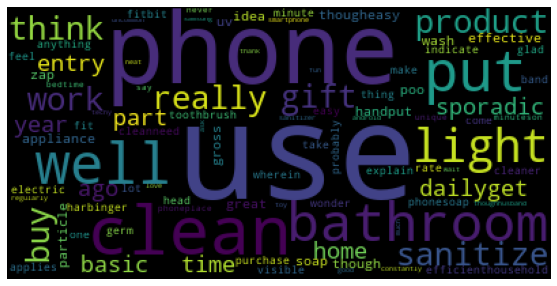



Pistachio Pedestal Word Cloud:


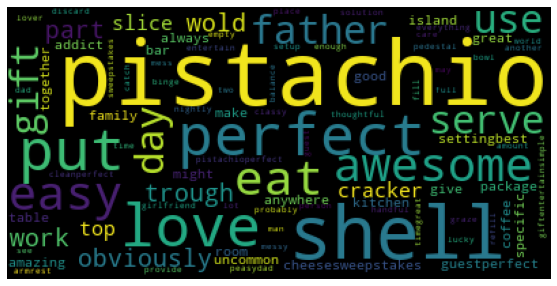



Rainbow Face Coverings - Set of 2 Word Cloud:


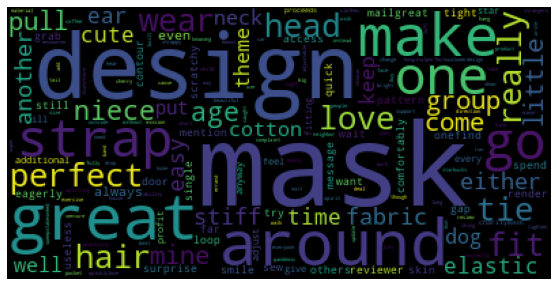



Recycled Metal Ostrich Planter Word Cloud:


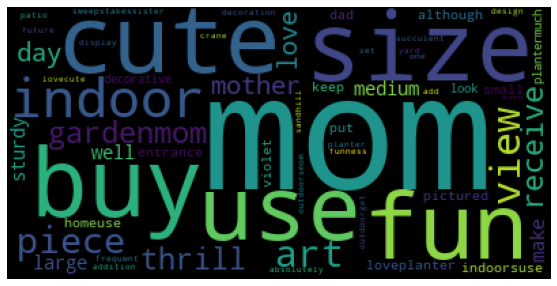



Repurposed Cotton Sari Robe Word Cloud:


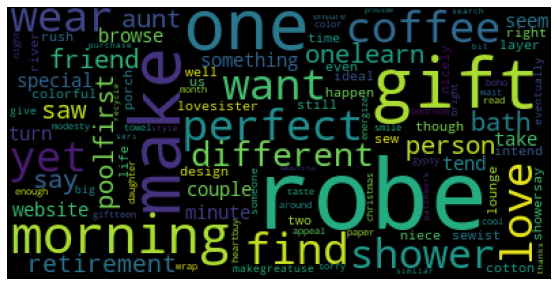



Spotted Wellies Garden Ducks Word Cloud:


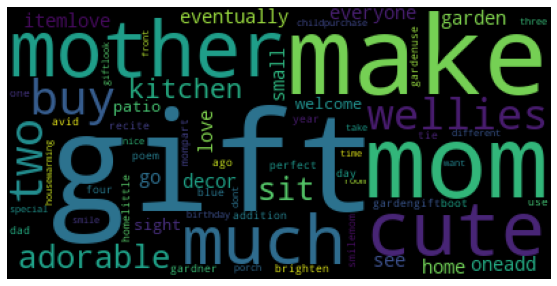



Storm Cloud Word Cloud:


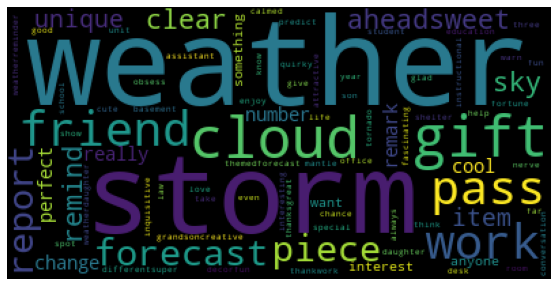



Swimming Koi Sculptures Word Cloud:


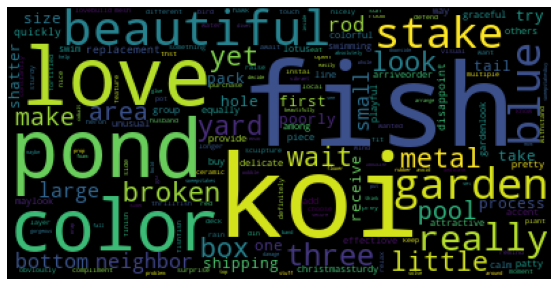



Table Topics Word Cloud:


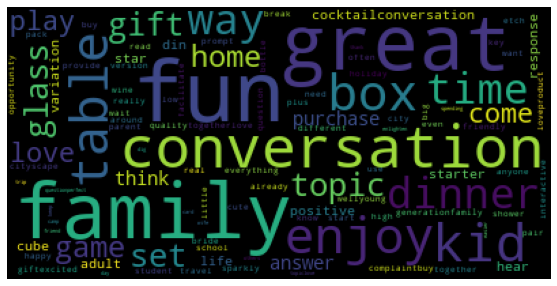



Tabletop Cornhole Word Cloud:


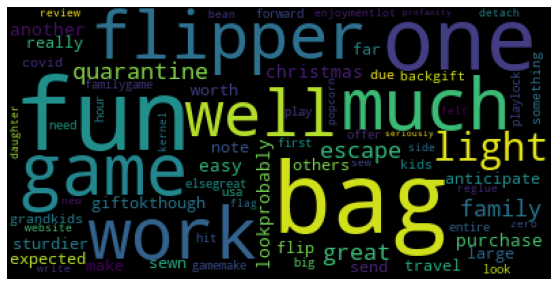



USA Coloring Tablecloth Word Cloud:


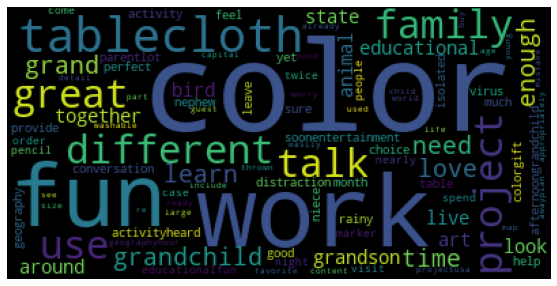



Velociraptor Garden Sculpture Set Word Cloud:


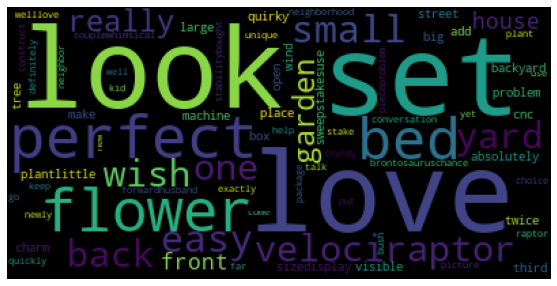



Wine Chilling Coasters with Glasses - Set of 2 Word Cloud:


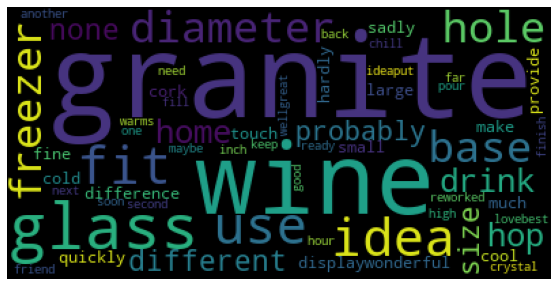



World Map Coloring Tablecloth Word Cloud:


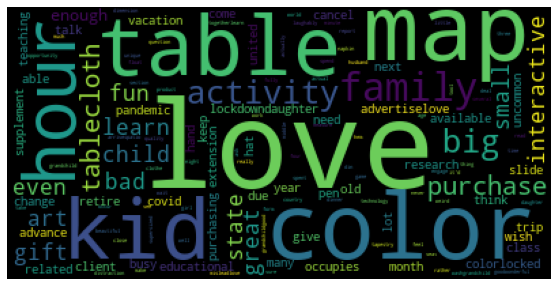

In [36]:
for product in df.index.get_level_values(0).unique():
  review_text = []
  print('\n')
  print(product, 'Word Cloud:')
  for i in df.loc[product].index:
    review_text.append(df.loc[product].loc[i]['cleaned_reviews'])
  
  text = ''.join(review_text)
  wordcloud = WordCloud().generate(text)
  plt.figure(figsize=(15, 5))
  plt.imshow(wordcloud)
  plt.axis("off")
  plt.show()

What's great about the Wordcloud's above in the way I set them up, is that through the words in all the reviews per product I can deduct significant things that might've lead to purchase. This can help when deciding angles on how to market a product. For example the product "Intersection of Love - Photo Print" has the words 'marriage', 'husband', 'wed', 'gift', and 'daughter' - so marketing can use this to position this as a gift best for newlyweds, or an anniversary gift, or place an add to parents who might want to get it as a gift for their child.


Another thing you can do is find keywords to use in your marketing campaigns. For example the product "Infinite Galaxy Puzzle" has the words 'challenge', 'unique', 'enjoy', 'together', and 'awesome'. With that you can come up with a marketing campaign like "If you're looking for a challenge, check out the Infinite Galaxy Puzzle. It's an awesome unique challenge that you can enjoy alone, or together with someone.